## Analisis con Segundo Dataset

In [2]:
import pandas as pd

csv_files = ['ml1.csv', 'ml2.csv']

df_csv_append = pd.DataFrame()

df = pd.concat([pd.read_csv('datasets/dataset_phase2/'+file) for file in csv_files ], ignore_index=True)

# remove special character
df.columns = df.columns.str.replace(' ', '')

In [3]:
import numpy as np

df["isAttack"] = df["Label"].apply(lambda x: 0 if x == 'BENIGN' else 1)
df = df.select_dtypes(include=np.number)
df.astype(np.number)
df

,DestinationPort,FlowDuration,TotalFwdPackets,TotalBackwardPackets,TotalLengthofFwdPackets,TotalLengthofBwdPackets,FwdPacketLengthMax,FwdPacketLengthMin,FwdPacketLengthMean,FwdPacketLengthStd,...,min_seg_size_forward,ActiveMean,ActiveStd,ActiveMax,ActiveMin,IdleMean,IdleStd,IdleMax,IdleMin,isAttack
0,88,640,7,4,440,358,220,0,62.857143,107.349008,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
1,88,900,9,4,600,2944,300,0,66.666667,132.287566,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
2,88,1205,7,4,2776,2830,1388,0,396.571429,677.274651,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
3,88,511,7,4,452,370,226,0,64.571429,110.276708,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
4,88,773,9,4,612,2944,306,0,68.000000,134.933317,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138607,53,32215,4,2,112,152,28,28,28.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
1138608,53,324,2,2,84,362,42,42,42.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
1138609,58030,82,2,1,31,6,31,0,15.500000,21.920310,...,32,0.0,0.0,0,0,0.0,0.0,0,0,0
1138610,53,1048635,6,2,192,256,32,32,32.000000,0.000000,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0


In [ ]:
allCorrelations = df.corr()['isAttack']
desiredCorr = allCorrelations[abs(allCorrelations) > 0.4]
desiredCorr

FlowDuration            0.450435
BwdPacketLengthMax      0.622027
BwdPacketLengthMean     0.619338
BwdPacketLengthStd      0.636083
FlowIATStd              0.558955
FlowIATMax              0.616557
FwdIATTotal             0.450878
FwdIATStd               0.631323
FwdIATMax               0.617180
MaxPacketLength         0.602519
PacketLengthMean        0.559024
PacketLengthStd         0.620329
PacketLengthVariance    0.601872
AveragePacketSize       0.557419
AvgBwdSegmentSize       0.619338
IdleMean                0.616946
IdleMax                 0.620071
IdleMin                 0.611374
isAttack                1.000000
Name: isAttack, dtype: float64

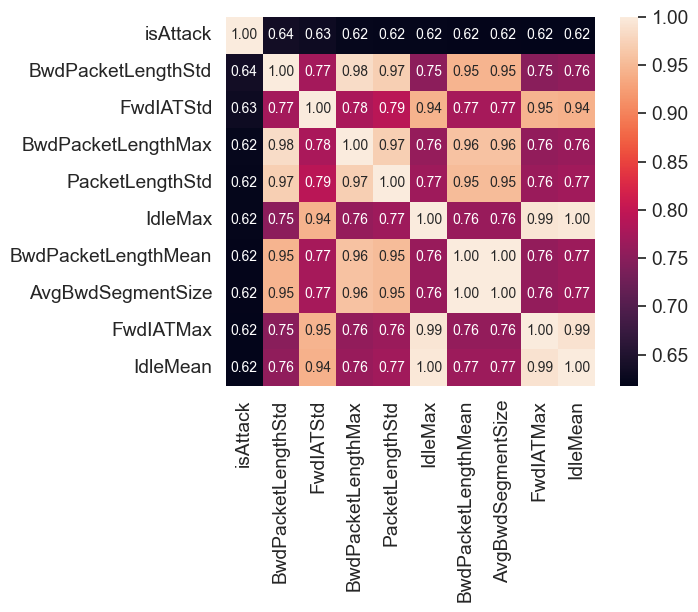

In [ ]:
import seaborn as sns

k = 10 #number of variables for heatmap
corrmat = df.corr()
cols = corrmat.nlargest(k, 'isAttack')['isAttack'].index
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)

In [ ]:
filtered_data = df[list(desiredCorr.index)]
filtered_data.head()

,FlowDuration,BwdPacketLengthMax,BwdPacketLengthMean,BwdPacketLengthStd,FlowIATStd,FlowIATMax,FwdIATTotal,FwdIATStd,FwdIATMax,MaxPacketLength,PacketLengthMean,PacketLengthStd,PacketLengthVariance,AveragePacketSize,AvgBwdSegmentSize,IdleMean,IdleMax,IdleMin,isAttack
0,38308,6,6.000000,0.000000,0.000000,38308,0,0.000000,0,6,6.000000,0.000000,0.000000,9.000000,6.000000,0.0,0,0,0
1,479,163,65.200000,89.278777,25.510409,73,479,38.942836,109,163,29.294118,56.529599,3195.595588,31.125000,65.200000,0.0,0,0,0
2,1095,1575,525.000000,813.326503,204.960972,810,1095,298.746130,915,1575,370.588235,671.751541,451250.132400,393.750000,525.000000,0.0,0,0,0
3,15206,3069,555.000000,977.480342,2519.931377,13391,15206,3322.417812,13391,3069,337.066667,704.654082,496537.374700,348.689655,555.000000,0.0,0,0,0
4,1092,1576,525.333333,813.842901,207.000929,794,1092,313.850738,910,1576,393.875000,704.585067,496440.116700,420.133333,525.333333,0.0,0,0,0


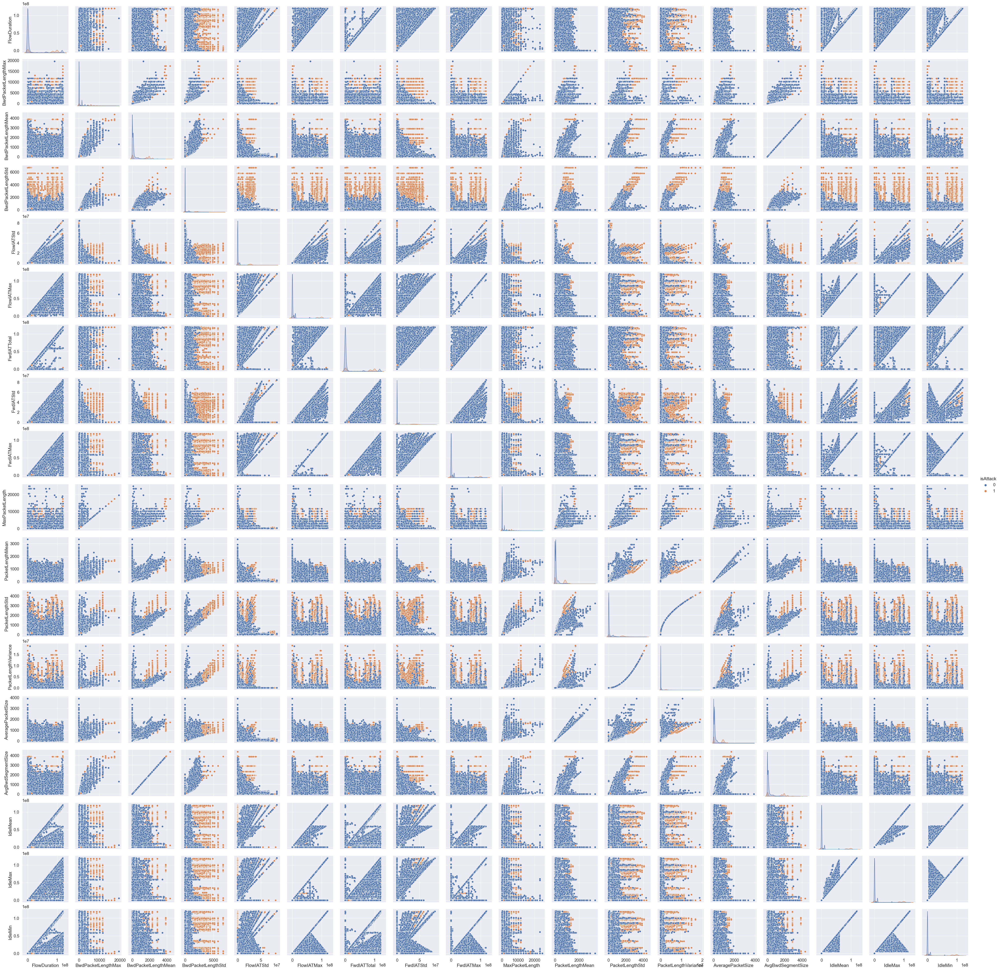

In [ ]:
sns.pairplot(df[filtered_data.columns], hue="isAttack")

FlowDuration: Kurtosis: 0.4719879339988786 Skewness: 1.4976754455812322 

BwdPacketLengthMax: Kurtosis: 3.8722517830723087 Skewness: 2.1148445734001062 

BwdPacketLengthMean: Kurtosis: 1.7650484815396013 Skewness: 1.7828124195403883 

BwdPacketLengthStd: Kurtosis: 6.0102353542159985 Skewness: 2.413752762659369 

FlowIATStd: Kurtosis: 5.462159924613223 Skewness: 2.346907960836372 

FlowIATMax: Kurtosis: 1.9274144946170901 Skewness: 1.921155000025667 

FwdIATTotal: Kurtosis: 0.5057148297034098 Skewness: 1.510306166533119 

FwdIATStd: Kurtosis: 3.3272727849412904 Skewness: 2.198792856280623 

FwdIATMax: Kurtosis: 1.93518258764494 Skewness: 1.923852911586967 

MaxPacketLength: Kurtosis: 3.844621825292741 Skewness: 2.0665713153279643 

PacketLengthMean: Kurtosis: 1.6329978889847627 Skewness: 1.692042050698115 

PacketLengthStd: Kurtosis: 3.101759662345514 Skewness: 1.9695397311631857 

PacketLengthVariance: Kurtosis: 16.873794908984504 Skewness: 3.5975875962893453 

AveragePacketSize: Kurto

KeyError: 'isAttack'

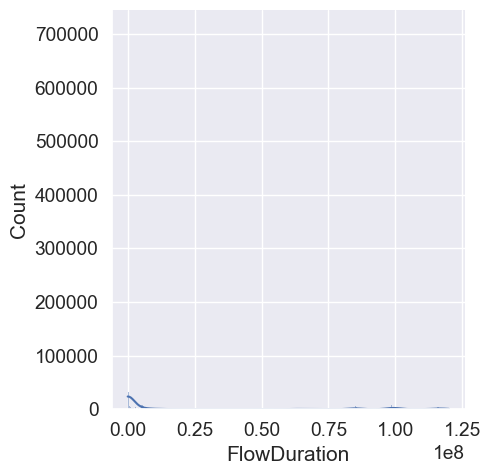

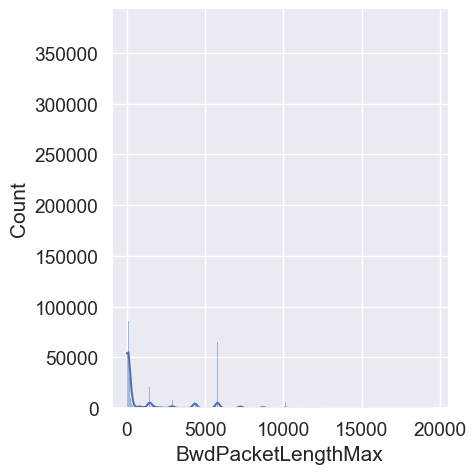

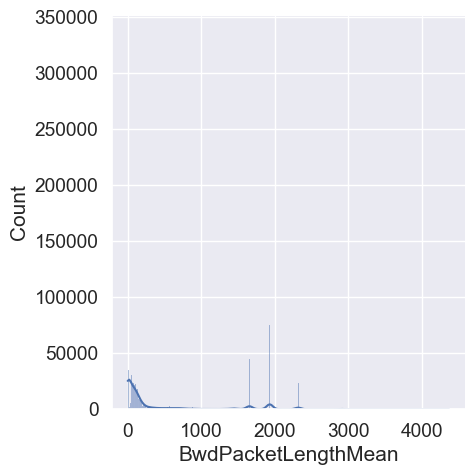

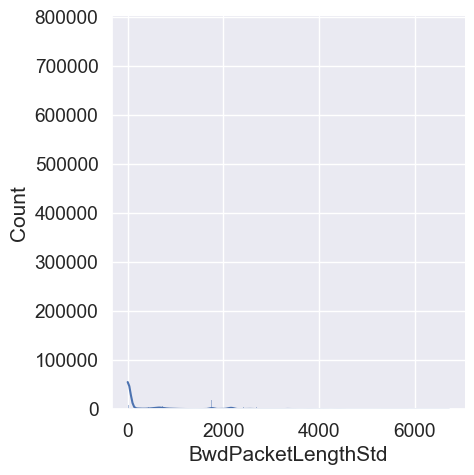

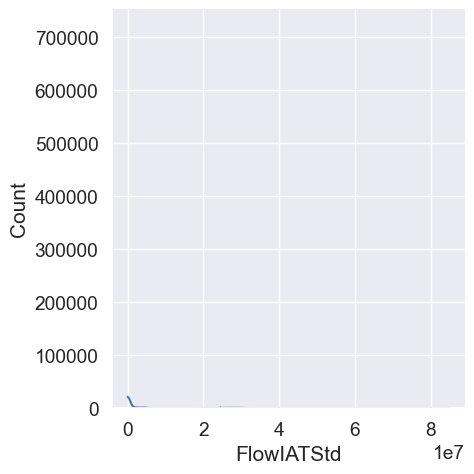

...

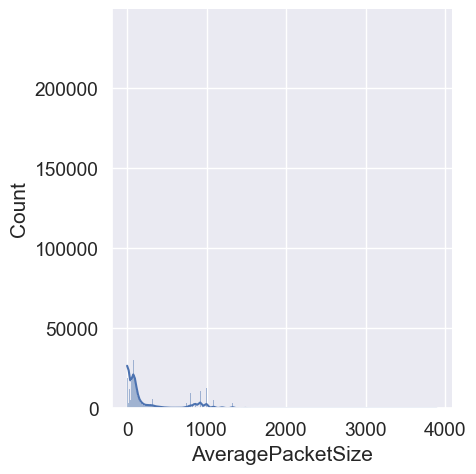

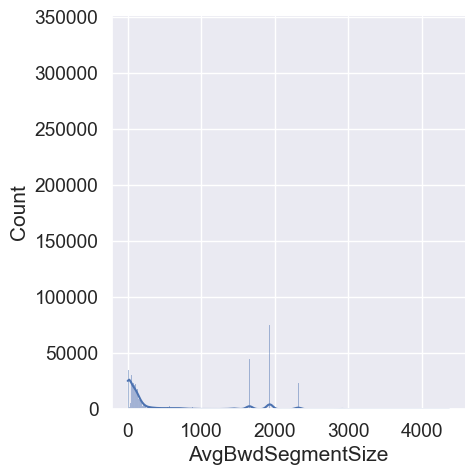

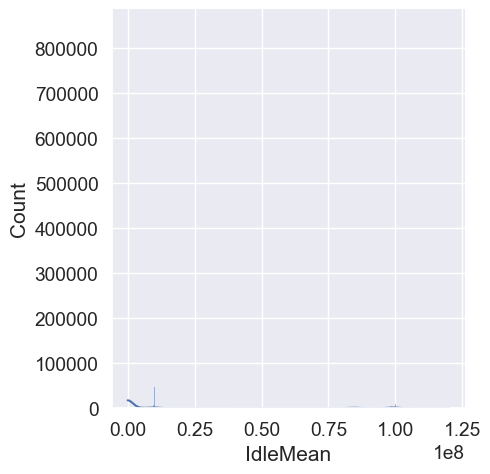

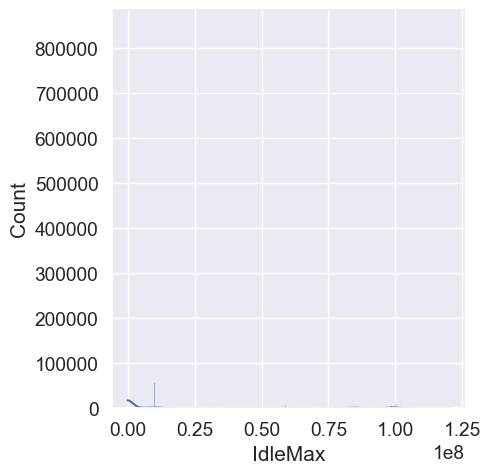

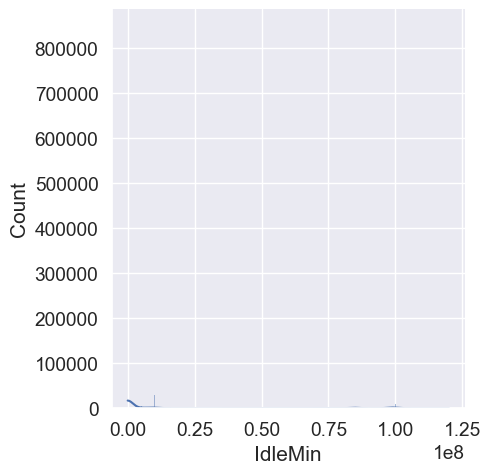

In [ ]:
from scipy import stats
for var in filtered_data:
    data = df[var].dropna(how='all', axis=0)
    
    # Gráfico
    sns.displot(data, kde=True)

    # Mostrando normalidad
    print('\033[1m' + var + '\033[0m' + ': Kurtosis:', stats.kurtosis(data), 'Skewness:', stats.skew(data), '\n')

In [ ]:
rpt = pf.ProfileReport(df)
rpt.to_file('./report.html')

In [4]:
csv_files = ['ml1.csv', 'ml2.csv']

df_csv_append = pd.DataFrame()

df = pd.concat([pd.read_csv('datasets/dataset_phase2/'+file) for file in csv_files ], ignore_index=True)

# remove special character
df.columns = df.columns.str.replace(' ', '')

In [5]:
import numpy as np
df["isAttack"] = df["Label"].apply(lambda x: 0 if x == 'BENIGN' else 1)
df = df.select_dtypes(include=np.number)
allCorrelations = df.corr()['isAttack']
desiredCorr = allCorrelations[abs(allCorrelations) > 0.4]

In [6]:
numeric_data = df.select_dtypes(include=np.number)
filtered_data = numeric_data[list(desiredCorr.index)[1:]]
numeric_data.astype(np.number)
for var in filtered_data:
    data = numeric_data[var].dropna(how='all', axis=0)

In [7]:
pd.set_option('display.max_columns', None)
df

,DestinationPort,FlowDuration,TotalFwdPackets,TotalBackwardPackets,TotalLengthofFwdPackets,TotalLengthofBwdPackets,FwdPacketLengthMax,FwdPacketLengthMin,FwdPacketLengthMean,FwdPacketLengthStd,BwdPacketLengthMax,BwdPacketLengthMin,BwdPacketLengthMean,BwdPacketLengthStd,FlowBytes/s,FlowPackets/s,FlowIATMean,FlowIATStd,FlowIATMax,FlowIATMin,FwdIATTotal,FwdIATMean,FwdIATStd,FwdIATMax,FwdIATMin,BwdIATTotal,BwdIATMean,BwdIATStd,BwdIATMax,BwdIATMin,FwdPSHFlags,BwdPSHFlags,FwdURGFlags,BwdURGFlags,FwdHeaderLength,BwdHeaderLength,FwdPackets/s,BwdPackets/s,MinPacketLength,MaxPacketLength,PacketLengthMean,PacketLengthStd,PacketLengthVariance,FINFlagCount,SYNFlagCount,RSTFlagCount,PSHFlagCount,ACKFlagCount,URGFlagCount,CWEFlagCount,ECEFlagCount,Down/UpRatio,AveragePacketSize,AvgFwdSegmentSize,AvgBwdSegmentSize,FwdHeaderLength.1,FwdAvgBytes/Bulk,FwdAvgPackets/Bulk,FwdAvgBulkRate,BwdAvgBytes/Bulk,BwdAvgPackets/Bulk,BwdAvgBulkRate,SubflowFwdPackets,SubflowFwdBytes,SubflowBwdPackets,SubflowBwdBytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,ActiveMean,ActiveStd,ActiveMax,ActiveMin,IdleMean,IdleStd,IdleMax,IdleMin,isAttack
0,88,640,7,4,440,358,220,0,62.857143,107.349008,179,0,89.5,103.345698,1.246875e+06,17187.500000,64.000000,135.557286,445,1,640,106.666667,194.325157,497,1,538,179.333333,303.686242,530,4,0,0,0,0,164,104,10937.500000,6250.000000,0,220,66.500000,99.001837,9801.363636,0,0,0,1,0,0,0,0,0,72.545455,62.857143,89.5,164,0,0,0,0,0,0,7,440,4,358,8192,2053,2,20,0.0,0.0,0,0,0.0,0.0,0,0,0
1,88,900,9,4,600,2944,300,0,66.666667,132.287566,1472,0,736.0,849.859596,3.937778e+06,14444.444440,75.000000,192.795228,684,1,900,112.500000,252.411229,734,1,766,255.333333,435.323252,758,3,0,0,0,0,204,104,10000.000000,4444.444444,0,1472,253.142857,527.434262,278186.901100,0,0,0,1,0,0,0,0,0,272.615385,66.666667,736.0,204,0,0,0,0,0,0,9,600,4,2944,8192,2053,2,20,0.0,0.0,0,0,0.0,0.0,0,0,0
2,88,1205,7,4,2776,2830,1388,0,396.571429,677.274651,1415,0,707.5,816.950631,4.652282e+06,9128.630705,120.500000,236.433336,777,1,1205,200.833333,397.058392,1008,1,927,309.000000,491.647231,876,1,0,0,0,0,164,104,5809.128631,3319.502075,0,1415,467.166667,690.098917,476236.515200,0,0,0,1,0,0,0,0,0,509.636364,396.571429,707.5,164,0,0,0,0,0,0,7,2776,4,2830,8192,2053,2,20,0.0,0.0,0,0,0.0,0.0,0,0,0
3,88,511,7,4,452,370,226,0,64.571429,110.276708,185,0,92.5,106.809800,1.608611e+06,21526.418790,51.100000,90.767652,299,1,511,85.166667,131.900594,349,1,462,154.000000,224.719826,412,1,0,0,0,0,164,104,13698.630140,7827.788650,0,226,68.500000,101.933579,10390.454550,0,0,0,1,0,0,0,0,0,74.727273,64.571429,92.5,164,0,0,0,0,0,0,7,452,4,370,8192,2053,2,20,0.0,0.0,0,0,0.0,0.0,0,0,0
4,88,773,9,4,612,2944,306,0,68.000000,134.933317,1472,0,736.0,849.859596,4.600259e+06,16817.593790,64.416667,148.698266,531,1,773,96.625000,196.665733,580,1,675,225.000000,348.901132,627,1,0,0,0,0,204,104,11642.949550,5174.644243,0,1472,254.000000,527.520762,278278.153800,0,0,0,1,0,0,0,0,0,273.538461,68.000000,736.0,204,0,0,0,0,0,0,9,612,4,2944,8192,2053,2,20,0.0,0.0,0,0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138607,53,32215,4,2,112,152,28,28,28.000000,0.000000,76,76,76.0,0.000000,8.194940e+03,186.248642,6443.000000,13617.579480,30780,3,30832,10277.333330,17755.843810,30780,4,3,3.000000,0.000000,3,3,0,0,0,0,80,64,124.165761,62.082881,28,76,41.714286,23.421602,548.571429,0,0,0,0,0,0,0,0,0,48.666667,28.000000,76.0,80,0,0,0,0,0,0,4,112,2,152,-1,-1,3,20,0.0,0.0,0,0,0.0,0.0,0,0,0
1138608,53,324,2,2,84,362,42,42,42.000000,0.000000,181,181,181.0,0.000000,1.376543e+06,12345.679010,108.000000,183.597386,320,2,2,2.000000,0.000000,2,2,2,2.000000,0.000000,2,2,0,0,0,0,40,40,6172.839506,6172.83950

In [8]:
df[['PacketLengthMean']].describe()

,PacketLengthMean
count,1.138612e+06
mean,2.114250e+02
std,3.225580e+02
min,0.000000e+00
25%,6.000000e+00
50%,6.460000e+01
75%,2.130382e+02
max,3.337143e+03


In [9]:
df['PacketLengthClassification'] = df['PacketLengthMean'].apply(
    lambda x: 
        'first' if float(x) >= 0 and float(x) <= 6.00 else
        ('second' if float(x) > 6.00 and float(x) <= 646 else
        ('third' if float(x) > 646 and float(x) <= 213.0382 else (
         'fourth' if float(x) >= 213.0382 else 'NAN'
        )))
)
filtered_data['PacketLengthClassification'] = df['PacketLengthClassification']

C:\Users\Sebastian\AppData\Local\Temp\ipykernel_21120\2691951600.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['PacketLengthClassification'] = df['PacketLengthClassification']


In [10]:
df['IdleMeanClassification'] = df['IdleMean'].apply(
    lambda x: 
        'first' if float(x) >= 0 and float(x) <= 5.392502e+06 else
        ('second' if float(x) > 6.00 and float(x) <= 1.200000e+08 else 'NAN')
)
filtered_data['IdleMeanClassification'] = df['IdleMeanClassification']

C:\Users\Sebastian\AppData\Local\Temp\ipykernel_21120\3664173560.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['IdleMeanClassification'] = df['IdleMeanClassification']


In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer

def getTfidfVectorizer(row_name):
    print("rowname", row_name)
    dataBodyList = filtered_data[row_name].to_list()

    bv = TfidfVectorizer(min_df=0.05, max_df=0.95, use_idf=True, ngram_range=(1,5))
    bv_matrix = bv.fit_transform(dataBodyList)
    vocabulario = bv.get_feature_names()
    bv_matrix = bv_matrix.toarray()

    return pd.DataFrame(bv_matrix, columns=vocabulario)
df_protocol_type = getTfidfVectorizer('PacketLengthClassification')
df_service = getTfidfVectorizer('IdleMeanClassification')

rowname PacketLengthClassification
rowname IdleMeanClassification


In [12]:
numeric_final_data = pd.concat([filtered_data, df_protocol_type, df_service], axis=1)
numeric_final_data.head()

,BwdPacketLengthMax,BwdPacketLengthMean,BwdPacketLengthStd,FlowIATStd,FlowIATMax,FwdIATTotal,FwdIATStd,FwdIATMax,MaxPacketLength,PacketLengthMean,PacketLengthStd,PacketLengthVariance,AveragePacketSize,AvgBwdSegmentSize,IdleMean,IdleMax,IdleMin,isAttack,PacketLengthClassification,IdleMeanClassification,first,fourth,second,first,second
0,179,89.5,103.345698,135.557286,445,640,194.325157,497,220,66.500000,99.001837,9801.363636,72.545455,89.5,0.0,0,0,0,second,first,0.0,0.0,1.0,1.0,0.0
1,1472,736.0,849.859596,192.795228,684,900,252.411229,734,1472,253.142857,527.434262,278186.901100,272.615385,736.0,0.0,0,0,0,second,first,0.0,0.0,1.0,1.0,0.0
2,1415,707.5,816.950631,236.433336,777,1205,397.058392,1008,1415,467.166667,690.098917,476236.515200,509.636364,707.5,0.0,0,0,0,second,first,0.0,0.0,1.0,1.0,0.0
3,185,92.5,106.809800,90.767652,299,511,131.900594,349,226,68.500000,101.933579,10390.454550,74.727273,92.5,0.0,0,0,0,second,first,0.0,0.0,1.0,1.0,0.0
4,1472,736.0,849.859596,148.698266,531,773,196.665733,580,1472,254.000000,527.520762,278278.153800,273.538461,736.0,0.0,0,0,0,second,first,0.0,0.0,1.0,1.0,0.0


In [23]:
numeric_sample_0 = numeric_final_data[numeric_final_data["isAttack"] == 0]
numeric_sample_1 = numeric_final_data[numeric_final_data["isAttack"] == 1]

numeric_sample: pd.DataFrame = pd.concat([numeric_sample_0.sample(n=50000), numeric_sample_1.sample(n=55000)])

X = numeric_sample.drop(['isAttack', 'PacketLengthClassification', 'IdleMeanClassification'], axis=1)
y = numeric_sample['isAttack']

In [24]:
X.columns

Index(['BwdPacketLengthMax', 'BwdPacketLengthMean', 'BwdPacketLengthStd',
       'FlowIATStd', 'FlowIATMax', 'FwdIATTotal', 'FwdIATStd', 'FwdIATMax',
       'MaxPacketLength', 'PacketLengthMean', 'PacketLengthStd',
       'PacketLengthVariance', 'AveragePacketSize', 'AvgBwdSegmentSize',
       'IdleMean', 'IdleMax', 'IdleMin', 'first', 'fourth', 'second', 'first',
       'second'],
      dtype='object')

In [26]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.218, random_state=1)


data_len = len(X)
print('Train:', round(len(X_train) / data_len, 2))
print('Val:', round(len(X_val) / data_len, 2))
print('Test:', len(X_test) / data_len)

Train: 0.55
Val: 0.15
Test: 0.3


In [27]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

model = KNeighborsClassifier()
model.fit(X_train, y_train)

y_preds = model.predict(X_test)
y_preds_vals = model.predict(X_val)

In [28]:
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, f1_score, precision_score
result = confusion_matrix(y_test, y_preds)


print("TP: ", result[0][0])
print("FP: ", result[0][1])
print("FN: ", result[1][0])
print("TN: ", result[1][1])

TP:  14377
FP:  700
FN:  356
TN:  16067


In [29]:
print ('Accuracy:', accuracy_score(y_test, y_preds))
print ("Precision:", precision_score(y_test, y_preds))
print ("Recall: ", recall_score(y_test, y_preds))
print ("F1: ", f1_score(y_test, y_preds))

Accuracy: 0.9664761904761905
Precision: 0.9582513270113914
Recall:  0.9783230834804847
F1:  0.9681831877071406


In [30]:
print("------------ On val -------------")
print ('Accuracy:', accuracy_score(y_val, y_preds_vals))
print ("Precision:", precision_score(y_val, y_preds_vals))
print ("Recall: ", recall_score(y_val, y_preds_vals))
print ("F1: ", f1_score(y_val, y_preds_vals))

------------ On val -------------
Accuracy: 0.9662984459838981
Precision: 0.9579144259995324
Recall:  0.9785048961069979
F1:  0.9681001890359169


In [31]:
from sklearn.model_selection import cross_validate, cross_val_predict

cv_results = cross_validate(model,X, y, cv=10)
cv_results = pd.DataFrame(cv_results)
print("accuracy: ", cv_results['test_score'].mean())

accuracy:  0.9651523809523809


In [32]:
arbol = DecisionTreeClassifier(max_depth=4, random_state=42) 
arbol = arbol.fit(X_train, y_train)
ay_pred = arbol.predict(X_test)
ay_pred_val = arbol.predict(X_val)

In [33]:
result_arbol = confusion_matrix(y_test, ay_pred)

print("TP: ", result_arbol[0][0])
print("FP: ", result_arbol[0][1])
print("FN: ", result_arbol[1][0])
print("TN: ", result_arbol[1][1])

result_arbol

TP:  13643
FP:  1434
FN:  792
TN:  15631


array([[13643,  1434],
       [  792, 15631]], dtype=int64)

In [34]:
result_arbol = confusion_matrix(y_val, ay_pred_val)
print("------------ On val -------------")
print("TP: ", result_arbol[0][0])
print("FP: ", result_arbol[0][1])
print("FN: ", result_arbol[1][0])
print("TN: ", result_arbol[1][1])

result_arbol

------------ On val -------------
TP:  6846
FP:  803
FN:  345
TN:  8029


array([[6846,  803],
       [ 345, 8029]], dtype=int64)

In [35]:
print ('Accuracy:', accuracy_score(y_test, ay_pred))
print ("Precision:", precision_score(y_test, ay_pred))
print ("Recall: ", recall_score(y_test, ay_pred))
print ("F1: ", f1_score(y_test, ay_pred))

Accuracy: 0.9293333333333333
Precision: 0.9159683562847935
Recall:  0.9517749497655726
F1:  0.9335284280936454


In [36]:
print("------------ On val -------------")
print ('Accuracy:', accuracy_score(y_val, ay_pred_val))
print ("Precision:", precision_score(y_val, ay_pred_val))
print ("Recall: ", recall_score(y_val, ay_pred_val))
print ("F1: ", f1_score(y_val, ay_pred_val))

------------ On val -------------
Accuracy: 0.928352992573176
Precision: 0.9090806159420289
Recall:  0.9588010508717458
F1:  0.9332790886899918


In [37]:
cv_results = cross_validate(model,X, y, cv=10)
cv_results = pd.DataFrame(cv_results)
print("accuracy: ", cv_results['test_score'].mean())

accuracy:  0.9651523809523809


In [43]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
numeric_sample_0 = numeric_final_data[numeric_final_data["isAttack"] == 0]
numeric_sample_1 = numeric_final_data[numeric_final_data["isAttack"] == 1]

numeric_sample: pd.DataFrame = pd.concat([numeric_sample_0.sample(n=50000), numeric_sample_1.sample(n=55000)])

X = numeric_sample.drop(['isAttack', 'PacketLengthClassification', 'IdleMeanClassification'], axis=1)
y = numeric_sample['isAttack']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.218, random_state=1)


arbol = RandomForestClassifier(max_depth=4, random_state=42) 
arbol = arbol.fit(X_train, y_train)
ay_pred = arbol.predict(X_test)
ay_pred_val = arbol.predict(X_val)

In [44]:
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, f1_score, precision_score
result_arbol = confusion_matrix(y_test, ay_pred)

print("TP: ", result_arbol[0][0])
print("FP: ", result_arbol[0][1])
print("FN: ", result_arbol[1][0])
print("TN: ", result_arbol[1][1])

result_arbol

TP:  13624
FP:  1453
FN:  632
TN:  15791


array([[13624,  1453],
       [  632, 15791]], dtype=int64)

In [45]:
print ('Accuracy:', accuracy_score(y_test, ay_pred))
print ("Precision:", precision_score(y_test, ay_pred))
print ("Recall: ", recall_score(y_test, ay_pred))
print ("F1: ", f1_score(y_test, ay_pred))

Accuracy: 0.9338095238095238
Precision: 0.9157388077012294
Recall:  0.9615173841563661
F1:  0.938069920099801


In [46]:
print("------------ On val -------------")
print ('Accuracy:', accuracy_score(y_val, ay_pred_val))
print ("Precision:", precision_score(y_val, ay_pred_val))
print ("Recall: ", recall_score(y_val, ay_pred_val))
print ("F1: ", f1_score(y_val, ay_pred_val))

------------ On val -------------
Accuracy: 0.9346564313798914
Precision: 0.9143762017871282
Recall:  0.9653689992834965
F1:  0.9391809468486784


In [47]:
from sklearn.model_selection import cross_validate
cv_results = cross_validate(arbol,X, y, cv=10)
cv_results = pd.DataFrame(cv_results)
print("accuracy: ", cv_results['test_score'].mean())

accuracy:  0.9285904761904762


In [48]:
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

numeric_sample_0 = numeric_final_data[numeric_final_data["isAttack"] == 0]
numeric_sample_1 = numeric_final_data[numeric_final_data["isAttack"] == 1]

numeric_sample: pd.DataFrame = pd.concat([numeric_sample_0.sample(n=50000), numeric_sample_1.sample(n=55000)])

X = numeric_sample.drop(['isAttack', 'PacketLengthClassification', 'IdleMeanClassification'], axis=1)
y = numeric_sample['isAttack']

estimators = [
  ('knn', KNeighborsClassifier()),
  ('rf', DecisionTreeClassifier(max_depth=4, random_state=42)),
]
clf = StackingClassifier(
  estimators=estimators,
  final_estimator=RandomForestClassifier(max_depth=4, random_state=42)
)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.218, random_state=1)

clf.fit(X_train, y_train)

clf_pred = clf.predict(X_test)
clf_pred_val = clf.predict(X_val)

In [49]:
result_arbol = confusion_matrix(y_test, clf_pred)

print("TP: ", result_arbol[0][0])
print("FP: ", result_arbol[0][1])
print("FN: ", result_arbol[1][0])
print("TN: ", result_arbol[1][1])

result_arbol

TP:  14548
FP:  529
FN:  407
TN:  16016


array([[14548,   529],
       [  407, 16016]], dtype=int64)

In [50]:
result_arbol = confusion_matrix(y_val, clf_pred_val)

print("TP: ", result_arbol[0][0])
print("FP: ", result_arbol[0][1])
print("FN: ", result_arbol[1][0])
print("TN: ", result_arbol[1][1])

result_arbol

TP:  7347
FP:  302
FN:  208
TN:  8166


array([[7347,  302],
       [ 208, 8166]], dtype=int64)

In [51]:
print ('Accuracy:', accuracy_score(y_test, clf_pred))
print ("Precision:", precision_score(y_test, clf_pred))
print ("Recall: ", recall_score(y_test, clf_pred))
print ("F1: ", f1_score(y_test, clf_pred))

Accuracy: 0.9702857142857143
Precision: 0.9680265941372016
Recall:  0.9752176825184193
F1:  0.9716088328075709


In [52]:
print("------------ On val -------------")
print ('Accuracy:', accuracy_score(y_val, clf_pred_val))
print ("Precision:", precision_score(y_val, clf_pred_val))
print ("Recall: ", recall_score(y_val,clf_pred_val))
print ("F1: ", f1_score(y_val, clf_pred_val))

------------ On val -------------
Accuracy: 0.9681707545403483
Precision: 0.9643363249881909
Recall:  0.9751612132791975
F1:  0.9697185607410047
